#  **Set up GPU and mount Google Drive to Colab**

#**Import Libraries**

In [1]:
import os
from os import listdir
import pandas as pd
import numpy as np
import glob
import tqdm
from typing import Dict
import matplotlib.pyplot as plt
%matplotlib inline

#plotly
!pip install chart_studio
import plotly.express as px
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot

!pip install cufflinks
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

#color
!pip install colorama
from colorama import Fore, Back, Style

import seaborn as sns
sns.set(style="whitegrid")

#pydicom
import pydicom

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

# Settings for pretty nice plots
plt.style.use('fivethirtyeight')
plt.show()

#  **EDA of CSV files**

In [2]:
#Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#Read the data
df = pd.read_csv("train.csv")

In [3]:
#First inspection
df.head()

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker



*   Two categorical variables: Sex and SmokingStatus
*   Three numeric variables: age, percentage and FVC



In [4]:
#How many patients do we have in training set?
print("No. of patients = ", len(df.Patient.unique()))
print("No. of observations = ", len(df))

No. of patients =  176
No. of observations =  1549


In [5]:
#Check for NaNs
df.isnull().sum()

Patient          0
Weeks            0
FVC              0
Percent          0
Age              0
Sex              0
SmokingStatus    0
dtype: int64

It seems that we have no problems with NaNs

In [6]:
#Summary of quantitiative variables
summary_df = pd.DataFrame(df.describe())
summary_df

,Weeks,FVC,Percent,Age
count,1549.000000,1549.000000,1549.000000,1549.000000
mean,31.861846,2690.479019,77.672654,67.188509
std,23.247550,832.770959,19.823261,7.057395
min,-5.000000,827.000000,28.877577,49.000000
25%,12.000000,2109.000000,62.832700,63.000000
50%,28.000000,2641.000000,75.676937,68.000000
75%,47.000000,3171.000000,88.621065,72.000000
max,133.000000,6399.000000,153.145378,88.000000


**WARNING:** There seems to be a 153% Is this actually possible? What type of anomaly is this? Should we exclude it from the model?

There are 195 observations with Percent above 100%.

In [7]:
#Checking how many observations have Percent > 100%
count_anomaly = 0
for index, row in df.iterrows():
  if row['Percent'] > 100:
    #print(row['Patient'], row['Percent'])
    count_anomaly += 1

print("No. of boservations with percent above 100% =", count_anomaly)
  

No. of boservations with percent above 100% = 195


We agggregate data by patient to have a better understandig of SmokingStatus

In [8]:
#Collapse the dataframe by patient to count the frequency of categorical variables
aggregate = df.groupby(['Patient','Sex', 'SmokingStatus'],
                       as_index=False).agg({'Weeks':'count',
                                            'Age':'mean',
                                            'FVC':'mean',
                                            'Weeks': 'max',
                                            'Percent': 'mean',
                                            })
aggregate.head()


,Patient,Sex,SmokingStatus,Weeks,Age,FVC,Percent
0,ID00007637202177411956430,Male,Ex-smoker,57,79,2113.888889,53.192977
1,ID00009637202177434476278,Male,Ex-smoker,60,69,3596.666667,83.807127
2,ID00010637202177584971671,Male,Ex-smoker,54,60,3037.111111,81.660333
3,ID00011637202177653955184,Male,Ex-smoker,58,72,3387.000000,87.564633
4,ID00012637202177665765362,Male,Never smoked,87,65,3348.777778,91.827843


In [9]:
summary_aggregate = pd.DataFrame(aggregate.describe())
summary_aggregate


,Weeks,Age,FVC,Percent
count,176.000000,176.000000,176.000000,176.000000
mean,66.812500,67.261364,2675.153366,77.390718
std,17.165549,7.088009,814.260326,19.285031
min,29.000000,49.000000,988.333333,45.598448
25%,57.000000,63.000000,2149.527778,62.876885
50%,62.000000,68.000000,2628.722222,75.868950
75%,75.250000,72.000000,3100.166667,87.508629
max,133.000000,88.000000,5845.444444,142.358891


**Age:** Minimum age is 49, while maximum age is 88. Median age is 67.23


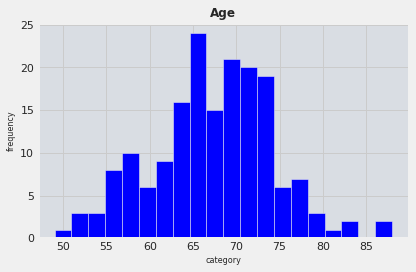

In [10]:
#Visualize the distribution of Age
n_bins = 20
fig, ax = plt.subplots(tight_layout = True)
ax.hist(aggregate.Age, bins = n_bins, density = False, color = 'blue')
ax.set_xlabel("category", fontsize = 8)
ax.set_ylabel("frequency", fontsize = 8)
ax.set_title( "Age", fontsize = 12.0, fontweight = 'bold')
ax.grid(True)
ax.set_facecolor("#d9dde3")
plt.show()

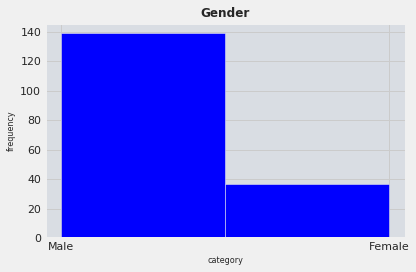

In [11]:
#Visualize the distribution of Gender
n_bins = 2
fig, ax = plt.subplots(tight_layout = True)
ax.hist(aggregate.Sex, bins = n_bins, density = False, color = 'blue')
ax.set_xlabel("category", fontsize = 8)
ax.set_ylabel("frequency", fontsize = 8)
ax.set_title( "Gender", fontsize = 12.0, fontweight = 'bold')
ax.grid(True)
ax.set_facecolor("#d9dde3")
plt.show()

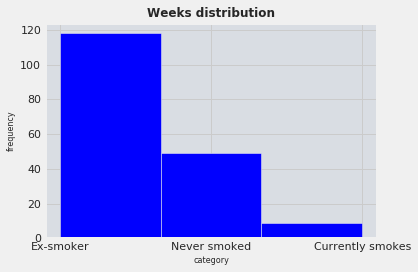

In [12]:
#Visualize the distribution of weeks
n_bins = 3
fig, ax = plt.subplots(tight_layout = True)
ax.hist(aggregate.SmokingStatus, bins = n_bins, density = False, color = 'blue')
ax.set_xlabel("category", fontsize = 8)
ax.set_ylabel("frequency", fontsize = 8)
ax.set_title( "Weeks distribution", fontsize = 12.0, fontweight = 'bold')
ax.grid(True)
ax.set_facecolor("#d9dde3")
plt.show()

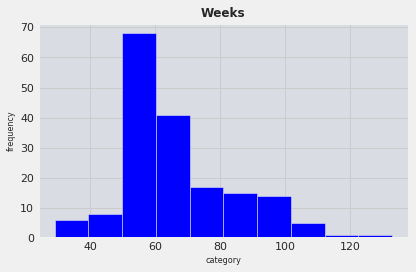

In [13]:
n_bins = 10
fig, ax = plt.subplots(tight_layout = True)
ax.hist(aggregate.Weeks, bins = n_bins, density = False, color = 'blue')
ax.set_xlabel("category", fontsize = 8)
ax.set_ylabel("frequency", fontsize = 8)
ax.set_title( "Weeks", fontsize = 12.0, fontweight = 'bold')
ax.grid(True)
ax.set_facecolor("#d9dde3")
plt.show()

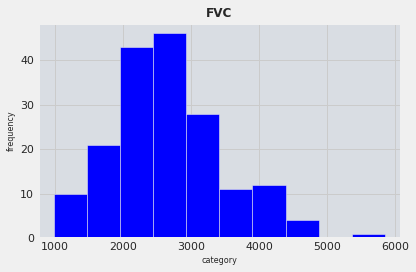

In [14]:
n_bins = 10
fig, ax = plt.subplots(tight_layout = True)
ax.hist(aggregate.FVC, bins = n_bins, density = False, color = 'blue')
ax.set_xlabel("category", fontsize = 8)
ax.set_ylabel("frequency", fontsize = 8)
ax.set_title( "FVC", fontsize = 12.0, fontweight = 'bold')
ax.grid(True)
ax.set_facecolor("#d9dde3")
plt.show()

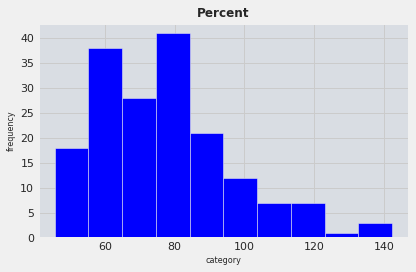

In [15]:
n_bins = 10
fig, ax = plt.subplots(tight_layout = True)
ax.hist(aggregate.Percent, bins = n_bins, density = False, color = 'blue')
ax.set_xlabel("category", fontsize = 8)
ax.set_ylabel("frequency", fontsize = 8)
ax.set_title( "Percent", fontsize = 12.0, fontweight = 'bold')
ax.grid(True)
ax.set_facecolor("#d9dde3")
plt.show()

**Smoking Status:** 
We have three smoking status categories, most patients are ex-smokers and only a few currently smoke.

In [16]:
#How many smoking categories do we have?
print(df.SmokingStatus.unique())

['Ex-smoker' 'Never smoked' 'Currently smokes']


In [17]:
#What is the most frequent smoking category?
freq_SmokingStatus = aggregate.groupby("SmokingStatus").count()
print(freq_SmokingStatus["Patient"])

SmokingStatus
Currently smokes      9
Ex-smoker           118
Never smoked         49
Name: Patient, dtype: int64


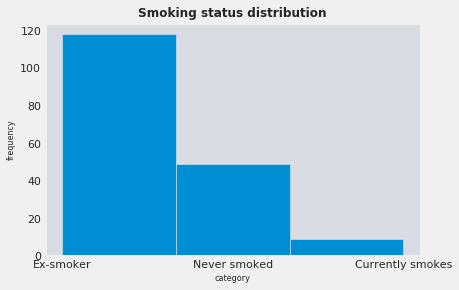

In [18]:
#Visualize the frquency of smoking status
n_bins = 3
fig, ax = plt.subplots()
ax.hist(aggregate.SmokingStatus, bins = n_bins)
ax.set_xlabel("category", fontsize = 8)
ax.set_ylabel("frequency", fontsize = 8)
ax.set_title( "Smoking status distribution", fontsize = 12.0, fontweight = 'bold')
ax.grid(False)
ax.set_facecolor("#d9dde3")
plt.show()

**Weeks:** We have significant dispersion in this variable. In particular, there is a dozen observations with negative records (that is visits to the doctor before the CT scan was taken).

In [19]:
#Sumarize weeks from the big dataframe 
pd.DataFrame(df["Weeks"].describe())

,Weeks
count,1549.000000
mean,31.861846
std,23.247550
min,-5.000000
25%,12.000000
50%,28.000000
75%,47.000000
max,133.000000


In [20]:
#Checking how many observations have negative weeks
count_anomaly = 0
for index, row in df.iterrows():
  if row['Weeks'] < 0:
    #print(row['Patient'], row['Percent'])
    count_anomaly += 1

print("No. of boservations with negative weeks =", count_anomaly)

No. of boservations with negative weeks = 11


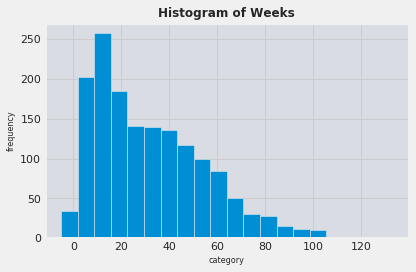

In [21]:
#Visualize weeks
n_bins = 20
fig, ax = plt.subplots(tight_layout = True)
ax.hist(df.Weeks, bins = n_bins, density = False)
ax.set_xlabel("category", fontsize = 8)
ax.set_ylabel("frequency", fontsize = 8)
ax.set_title( "Histogram of Weeks", fontsize = 12.0, fontweight = 'bold' )
ax.grid(True)
ax.set_facecolor("#d9dde3")
plt.show()

**Patients** For a typical patient, FVC deteriorates over time.

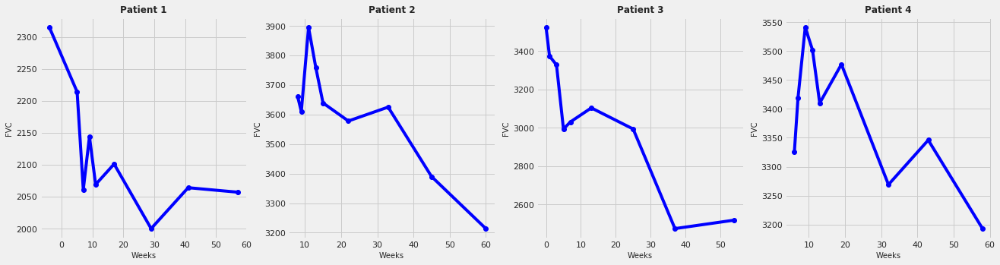

In [22]:

#Visualize a sample of 4 patients

n = 4
patients = df.Patient.unique()
plt.figure(figsize = (20,5))
count = 1

for i in range(len(patients[:n])):
  ax = plt.subplot(1, len(patients[:n]), i + 1 )
  single_patient = df[df['Patient'] == patients[i]]
  weeks = single_patient.Weeks
  fvc = single_patient.FVC
  percent = single_patient.Percent

  plt.plot(weeks, fvc, color = 'blue', marker = 'o')
  plt.xlabel("Weeks", fontsize = 10)
  plt.ylabel("FVC",  fontsize = 10)
  plt.title("Patient %d" % count, fontsize = 12, fontweight = 'bold')
  plt.grid(True)
  count += 1
  #ax.grid(True)
  #ax.set_facecolor("#d9dde3")
plt.show()



**Gender distribution** is disproportionately biased towards male patients

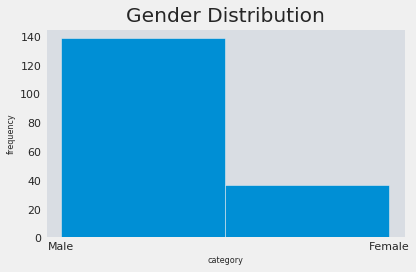

In [23]:
#Visualize gender distribution
n_bins = 2
fig, ax = plt.subplots(tight_layout = True)
ax.hist(aggregate.Sex, bins = n_bins, density = False)
ax.set_xlabel("category", fontsize = 8)
ax.set_ylabel("frequency", fontsize = 8)
ax.set_title( "Gender Distribution")
ax.grid(False)
ax.set_facecolor("#d9dde3")
plt.show()

In [24]:
#What is the most frequent gender?
freq_Gender = aggregate.groupby("Sex").count()
print(freq_Gender["Patient"])

Sex
Female     37
Male      139
Name: Patient, dtype: int64


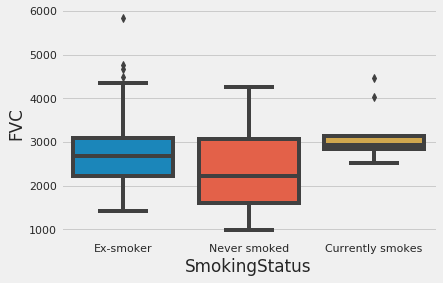

In [25]:
import seaborn as sns
ax = sns.boxplot(x="SmokingStatus", y="FVC", data=aggregate)

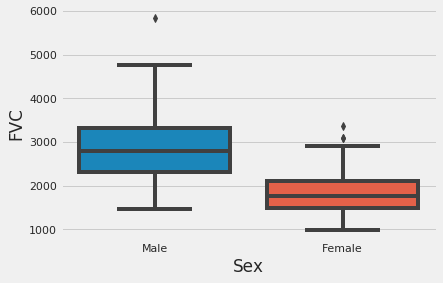

In [26]:
import seaborn as sns
ax = sns.boxplot(x="Sex", y="FVC", data=aggregate)

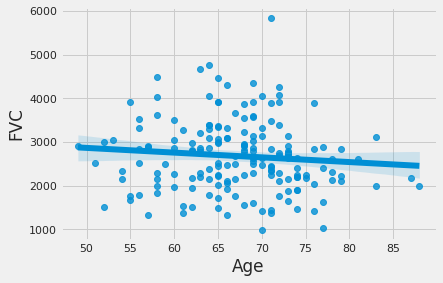

In [27]:
import seaborn as sns
ax = sns.regplot(x="Age", y="FVC", data=aggregate)

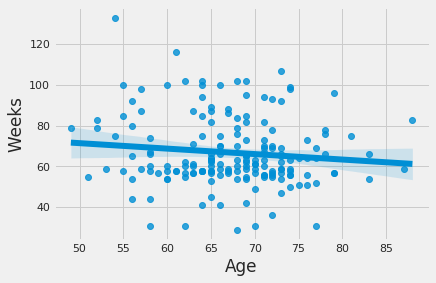

In [28]:
import seaborn as sns
ax = sns.regplot(x="Age", y="Weeks", data=aggregate)

In [29]:
df.Percent.describe()

count    1549.000000
mean       77.672654
std        19.823261
min        28.877577
25%        62.832700
50%        75.676937
75%        88.621065
max       153.145378
Name: Percent, dtype: float64

In [30]:
max = []
min = []
for i in patients[:4]:
  max.append(df[df["Patient"] == i].FVC.max)
  min.append(df[df["Patient"] == i].FVC.max)


In [31]:
features=df.groupby(['Patient','Sex', 'SmokingStatus'], as_index = False).agg(
    age=('Age', 'max'),
    min_week=('Weeks', 'min'),
    max_week=('Weeks', 'max'), 
    average_week=('Weeks', np.mean), 
    median_week=('Weeks', np.median),
    fvc_mean=('FVC', np.mean),
    fvc_median=('FVC', np.median),
    fvc_max=('FVC', 'max'),
    fvc_min=('FVC', 'min'),
    percent_mean=('Percent', np.mean),
    percent_median=('Percent', np.median),
    percent_max=('Percent', 'max'),
    percent_min=('Percent', 'min'))

features.head()

,age,min_week,max_week,average_week,median_week,fvc_mean,fvc_median,fvc_max,fvc_min,percent_mean,percent_median,percent_max,percent_min
0,ID00007637202177411956430,Male,Ex-smoker,79,-4,57,19.111111,11.0,2113.888889,2069.0,2315,2000,53.192977
1,ID00009637202177434476278,Male,Ex-smoker,69,8,60,24.000000,15.0,3596.666667,3625.0,3895,3214,83.807127
2,ID00010637202177584971671,Male,Ex-smoker,60,0,54,16.111111,7.0,3037.111111,3030.0,3523,2474,81.660333
3,ID00011637202177653955184,Male,Ex-smoker,72,6,58,22.000000,13.0,3387.000000,3410.0,3541,3193,87.564633
4,ID00012637202177665765362,Male,Never smoked,65,33,87,49.777778,41.0,3348.777778,3324.0,3759,2971,91.827843


In [32]:
features['prognosis'] = features.fvc_max - features.fvc_min
features

,age,min_week,max_week,average_week,median_week,fvc_mean,fvc_median,fvc_max,fvc_min,percent_mean,percent_median,percent_max,percent_min,prognosis
0,ID00007637202177411956430,Male,Ex-smoker,79,-4,57,19.111111,11.0,2113.888889,2069.0,2315,2000,53.192977,-2102.888889
1,ID00009637202177434476278,Male,Ex-smoker,69,8,60,24.000000,15.0,3596.666667,3625.0,3895,3214,83.807127,-3581.666667
2,ID00010637202177584971671,Male,Ex-smoker,60,0,54,16.111111,7.0,3037.111111,3030.0,3523,2474,81.660333,-3030.111111
3,ID00011637202177653955184,Male,Ex-smoker,72,6,58,22.000000,13.0,3387.000000,3410.0,3541,3193,87.564633,-3374.000000
4,ID00012637202177665765362,Male,Never smoked,65,33,87,49.777778,41.0,3348.777778,3324.0,3759,2971,91.827843,-3307.777778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171,ID00419637202311204720264,Male,Ex-smoker,73,6,59,21.777778,13.0,2782.333333,2738.0,3020,2694,64.663320,-2769.333333
172,ID00421637202311550012437,Male,Ex-smoker,68,15,70,35.900000,26.0,2759.000000,2755.5,2853,2628,82.644381,-2733.000000
173,ID00422637202311677017371,Male,Ex-smoker,73,6,47,20.875000,16.0,1885.875000,1913.5,1955,1713,74.919553,-1869.875000
174,ID00423637202312137826377,Male,Ex-smoker,72,17,70,32.555556,23.0,2750.000000,2700.0,3294,2432,66.169394,-2727.000000


# **EDA of DCM FILES**


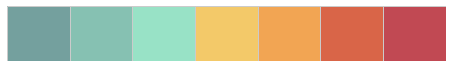

In [34]:
# Regular Imports

#pydicom
!pip install pydicom

import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg

!pip install tabulate
from tabulate import tabulate

!pip install missingno
import missingno as msno 
from IPython.display import display_html
import PIL.Image
import gc
import cv2
from scipy.stats import pearsonr

import pydicom # for DICOM images
from skimage.transform import resize
import copy
import re

# Segmentation
from glob import glob
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import scipy.ndimage
from skimage import morphology
from skimage import measure
from skimage.transform import resize
from sklearn.cluster import KMeans
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.tools import FigureFactory as FF
from plotly.graph_objs import *
init_notebook_mode(connected=True) 

import warnings
warnings.filterwarnings("ignore")


# Set Color Palettes for the notebook
custom_colors = ['#74a09e','#86c1b2','#98e2c6','#f3c969','#f2a553', '#d96548', '#c14953']
sns.palplot(sns.color_palette(custom_colors))

# Set Style
sns.set_style("whitegrid")
sns.despine(left=True, bottom=True)

In [35]:
# Import train + test data
train = pd.read_csv("./train.csv")
test = pd.read_csv("./test.csv")

# Train len
print("Total Recordings in Train Data: {:,}".format(len(train)))

Total Recordings in Train Data: 1,549


In [36]:
print(Fore.YELLOW + 'Train .dcm number of images:',Style.RESET_ALL, len(list(os.listdir('./train'))), '\n' +
      Fore.BLUE + 'Test .dcm number of images:',Style.RESET_ALL, len(list(os.listdir('./test'))), '\n' +
      '--------------------------------', '\n' +
      'There is the same number of images as in train/ test .csv datasets')

Train .dcm number of images:  177 
Test .dcm number of images:  5 
-------------------------------- 
There is the same number of images as in train/ test .csv datasets


In [37]:
#changing the working directory
%cd ./train/ID00228637202259965313869

/home/ubuntu/project/train/ID00228637202259965313869


In [38]:

def plot_pixel_array(dataset, figsize=(5,5)):
    plt.figure(figsize=figsize)
    plt.grid(False)
    plt.imshow(dataset.pixel_array, cmap='gray') # cmap=plt.cm.bone)
    plt.show()

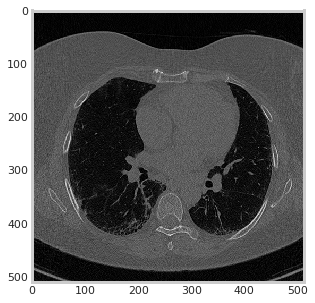

In [39]:

ds=pydicom.read_file('./185.dcm',force=True)
plot_pixel_array(ds, figsize= (5,5))

/home/ubuntu/project
total images for patient ID00123637202217151272140:  258


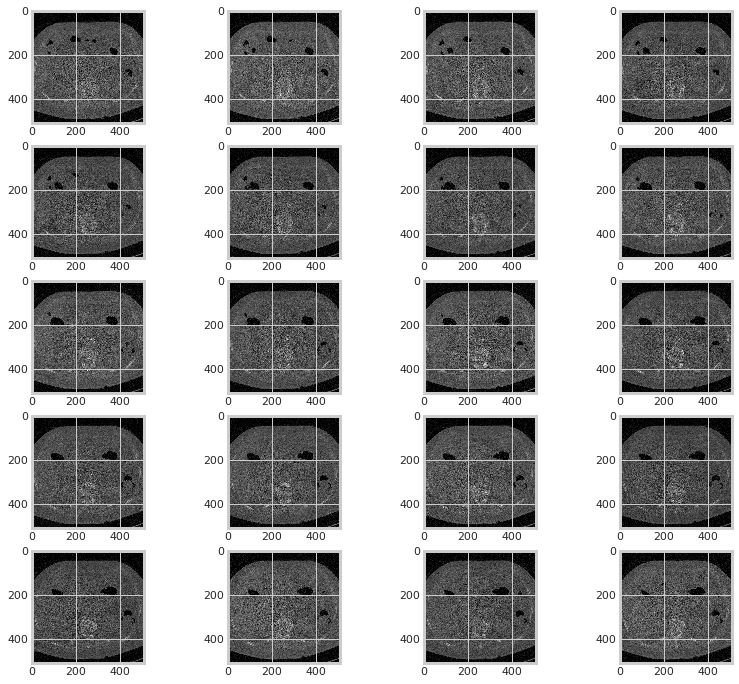

In [40]:
#changing the working directory
%cd /home/ubuntu/project/

imdir = "./train/ID00123637202217151272140"
print("total images for patient ID00123637202217151272140: ", len(os.listdir(imdir)))

# view first (columns*rows) images in order
fig=plt.figure(figsize=(12, 12))
columns = 4
rows = 5
imglist = os.listdir(imdir)
for i in range(1, columns*rows +1):
    filename = imdir + "/" + str(i) + ".dcm"
    ds = pydicom.dcmread(filename)
    fig.add_subplot(rows, columns, i)
    plt.imshow(ds.pixel_array, cmap='gray')
plt.show()

total images for patient ID00123637202217151272140:  258


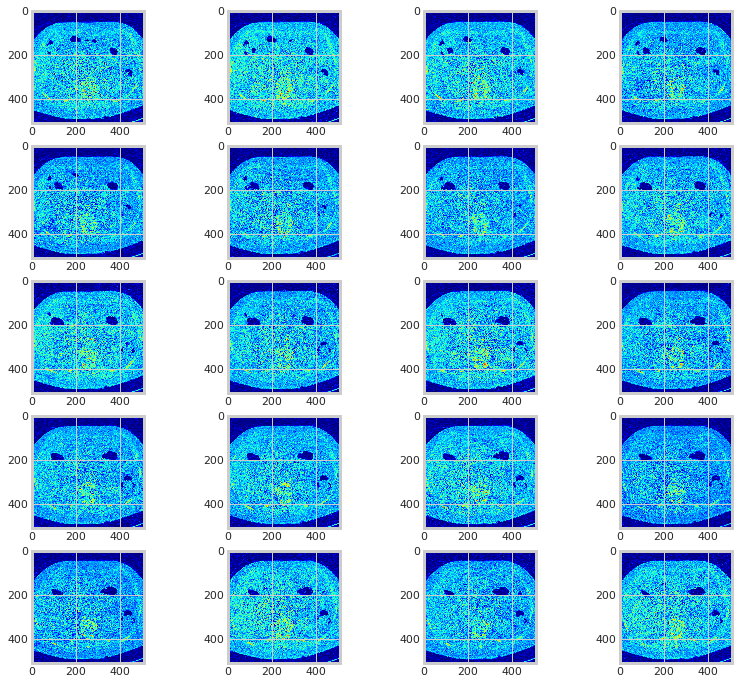

In [41]:
print("total images for patient ID00123637202217151272140: ", len(os.listdir(imdir)))

# view first (columns*rows) images in order
fig=plt.figure(figsize=(12, 12))
columns = 4
rows = 5
imglist = os.listdir(imdir)
for i in range(1, columns*rows +1):
    filename = imdir + "/" + str(i) + ".dcm"
    ds = pydicom.dcmread(filename)
    fig.add_subplot(rows, columns, i)
    plt.imshow(ds.pixel_array, cmap='jet')
plt.show()

In [42]:
#How many images per patient?
%cd /home/ubuntu/project/

# Create base directory for Train .dcm files
director = "./train"

# Create path column with the path to each patient's CT
train["Path"] = director + "/" + train["Patient"]

# Create variable that shows how many CT scans each patient has
train["CT_number"] = 0

#For each element give me the number of images in the corresponding forlder
for k, path in enumerate(train["Path"]):
    train["CT_number"][k] = len(os.listdir(path))

/home/ubuntu/project


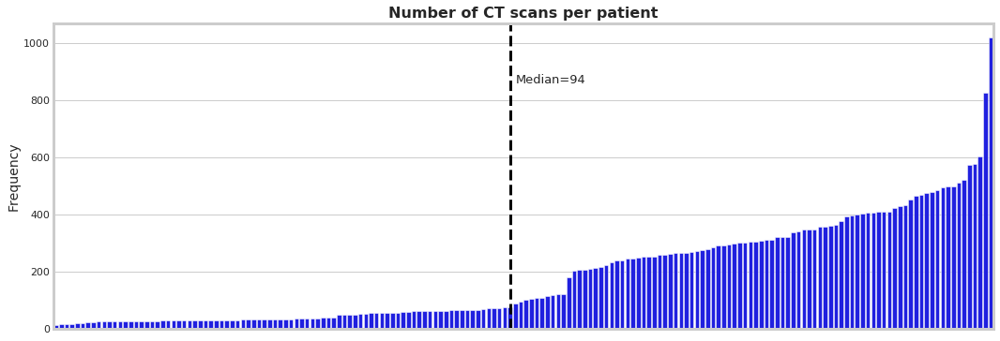

In [43]:
#Number of CT scans per Patient

# print("Minimum number of CT scans: {}".format(train['CT_number'].min()), "\n"
# +
# "Maximum number of CT scans: {:,}".format(train["CT_number"].max()))

#Scans per Patient
data = train.groupby(by = "Patient")["CT_number"].first().reset_index(drop = False)

#Sort by number of CT images
data = data.sort_values(['CT_number']).reset_index(drop = True)

#Plot
plt.figure(figsize = (16,6))
p = sns.barplot(data["Patient"], data["CT_number"], color = 'blue')
plt.axvline(x=85, color='black', linestyle = '--', lw=3)

plt.title("Number of CT scans per patient", fontsize = 16, fontweight = 'bold')
plt.xlabel("Patient", fontsize = 14)
plt.ylabel("Frequency", fontsize = 14)

plt.text(86, 860, "Median=94", fontsize = 13)

p.axes.get_xaxis().set_visible(False)





In [44]:
class bcolors:
  OKBLUE = '\033[96m'
  OKGREEN = '\033[92m'

Patient id......: ID00007637202177411956430 
Modality.......: CT 
Rows...........: 512 
Columns........: 512


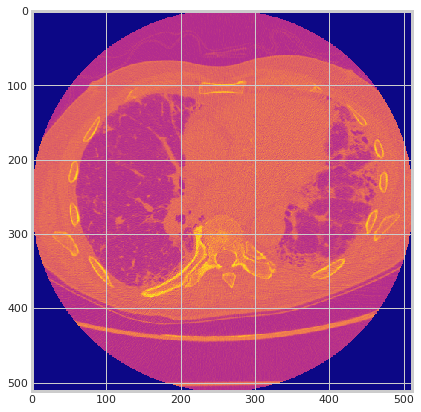

In [45]:
path = "./train/ID00007637202177411956430/19.dcm"
dataset = pydicom.dcmread(path)

print(bcolors.OKBLUE + "Patient id......:", dataset.PatientID, "\n" + 
      "Modality.......:", dataset.Modality, "\n" +
      "Rows...........:", dataset.Rows, "\n" +
      "Columns........:", dataset.Columns)

plt.figure(figsize = (7,7))
plt.imshow(dataset.pixel_array, cmap = "plasma")
#plt.axis('off')


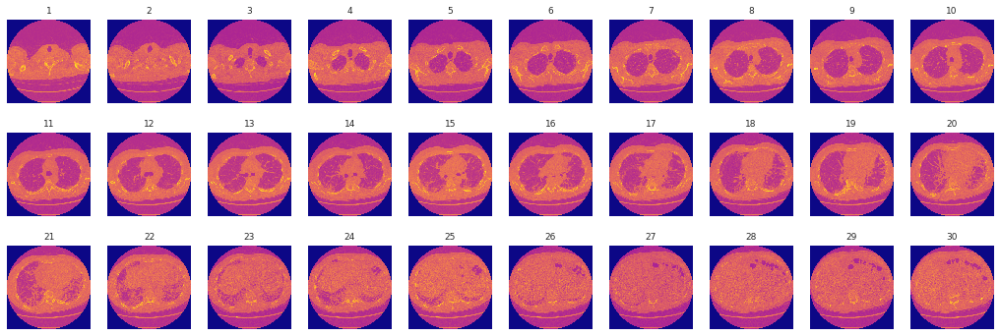

In [46]:
#We can see how the jlungs expand image by image
patient_dir = "./train/ID00007637202177411956430"
datasets = []

#First order the files in the dataset
files = []
for dcm in list(os.listdir(patient_dir)):
  files.append(dcm)
files.sort(key = lambda f: int(re.sub('\D', '', f)))

# Read in the dataset
for dcm in files:
  path = patient_dir + "/" + dcm
  datasets.append(pydicom.dcmread(path))

#Plot the images

fig = plt.figure(figsize = (16,6))
columns = 10
rows = 3

for i in range(1, columns*rows +1):
  img = datasets[i-1].pixel_array
  fig.add_subplot(rows, columns, i)
  plt.imshow(img, cmap = "plasma")
  plt.title(i, fontsize = 9)
  plt.axis('off');







In [47]:
#you can turn this into a GIF

from PIL import Image
from IPython.display import Image as show_gif
import scipy.misc
import matplotlib

def create_gif(number_of_CT = 87):
  """Picks a patient at random and creates a GIF with their CT scans."""

  # Select on of the patients
  # patient = 'ID00007637202177411956430'
  patient = train[train["CT_number"] == number_of_CT].sample(random_state = 1)['Patient'].values[0]

  # === read in .dcm files ===
  patient_dir = "./train/" + patient
  datasets = []

  #First order the files in the dataset
  files = []
  for dcm in list(os.listdir(patient_dir)):
    files.append(dcm)
  files.sort(key = lambda f: int(re.sub('\D','', f)))

  #Read in the dataset from the patient path
  for dcm in files:
    path = patient_dir + "/" + dcm
    datasets.append(pydicom.dcmread(path))

  #===SAVE AS .png ===

  #Create directory to save the png files
  if os.path.isdir(f"png_{patient}") == False:
    os.mkdir(f"png_{patient}")

  #Save images to PNG
  for i in range(len(datasets)):
    img = datasets[i].pixel_array
    mpimg.imsave(f'png_{patient}/img_{i}.png', img)

  # == create GIF==
  #First oder the files in the dataset (again)
  files = []
  for png in list(os.listdir(f"./png_{patient}")):
    files.append(png)
  files.sort(key=lambda f: int(re.sub('\D', '', f)))

  # Create the frames
  frames = []

  #Create frames
  for file in files:
    # print(".../working/png_images/" + name)
    new_frame = PIL.Image.open(f"./png_{patient}/" + file)
    frames.append(new_frame)

  #Save into a GIF file that loops forever
  frames[0].save(f'gif_{patient}.gif', format = 'GIF',
                 append_images = frames[1:],
                 save_all=True,
                 duration = 200, loop = 0)


In [48]:
create_gif(number_of_CT=12)
create_gif(number_of_CT=30)
create_gif(number_of_CT=87)

print("First file len:", len(os.listdir("./png_ID00165637202237320314458")), "\n" +
      "Second file len:", len(os.listdir("./png_ID00199637202248141386743")), "\n" +
      "Third file len:", len(os.listdir("./png_ID00340637202287399835821")))

First file len: 12 
Second file len: 87 
Third file len: 30


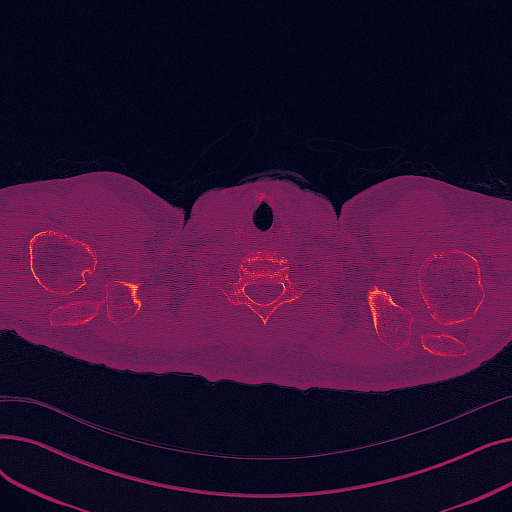

In [49]:
show_gif(filename="./gif_ID00340637202287399835821.gif", format='png', width=400, height=400)

**DICOM Lung Mask**
Segmentation is part of the preprocessing method
We want to auto-detect the boundaries surrounding a volume of interest
However, we bear the risk of excluding important parts.

In [50]:
def make_lungmask(img, display = False):
  row_size = img.shape[0]
  col_size = img.shape[1]

  #Normalize
  mean = np.mean(img)
  std = np.std(img)
  img = img-mean
  img = img/std

  #Find the average pixel value near the lungs
  #to renormalize washed out images

  middle = img[int(col_size/5): int(col_size/5*4), int(row_size/5):int(row_size/5*4)]
  mean = np.mean(middle)
  max = np.max(img)
  min = np.min(img)

  #To improve threshold finding, move the underflow and overflow on the pixel spectrum
  img[img == max] = mean
  img[img == min] = mean

  #We use k-means to separate foreground (soft tissue/ bone) and banckground (lung/air)
  kmeans = KMeans(n_clusters=2).fit(np.reshape(middle,[np.prod(middle.shape),1]))
  centers = sorted(kmeans.cluster_centers_.flatten())
  threshold = np.mean(centers)
  thresh_img = np.where(img<threshold, 1.0,0.0) #threshold the image

  #Erodde away
  eroded = morphology.erosion(thresh_img, np.ones([3,3]))
  dilation = morphology.dilation(eroded, np.ones([8,8]))
  labels = measure.label(dilation) #Different labels are displayed in different colors
  label_vals = np.unique(labels)
  regions = measure.regionprops(labels)
  good_labels = []
  for prop in regions:
    B = prop.bbox
    if B[2] - B[0] < row_size / 10*9 and B[3] - B[1] < col_size/10*9 and B[0] > row_size/5 and B[2] < col_size/ 5*4:
        good_labels.append(prop.label)
  mask = np.ndarray([row_size, col_size], dtype = np.int8)
  mask[:] = 0

  
   #  After just the lungs are left, we do another large dilation
    #  in order to fill in and out the lung mask 
    
  for N in good_labels:
      mask = mask + np.where(labels==N,1,0)
  mask = morphology.dilation(mask,np.ones([10,10])) # one last dilation
  if (display):
        fig, ax = plt.subplots(3, 2, figsize=[12, 12])
        ax[0, 0].set_title("Original")
        ax[0, 0].imshow(img, cmap='gray')
        ax[0, 0].axis('off')
        ax[0, 1].set_title("Threshold")
        ax[0, 1].imshow(thresh_img, cmap='gray')
        ax[0, 1].axis('off')
        ax[1, 0].set_title("After Erosion and Dilation")
        ax[1, 0].imshow(dilation, cmap='gray')
        ax[1, 0].axis('off')
        ax[1, 1].set_title("Color Labels")
        ax[1, 1].imshow(labels)
        ax[1, 1].axis('off')
        ax[2, 0].set_title("Final Mask")
        ax[2, 0].imshow(mask, cmap='gray')
        ax[2, 0].axis('off')
        ax[2, 1].set_title("Apply Mask on Original")
        ax[2, 1].imshow(mask*img, cmap='gray')
        #ax[2, 1].axis('off')
      
        plt.show()
  return mask*img    




  

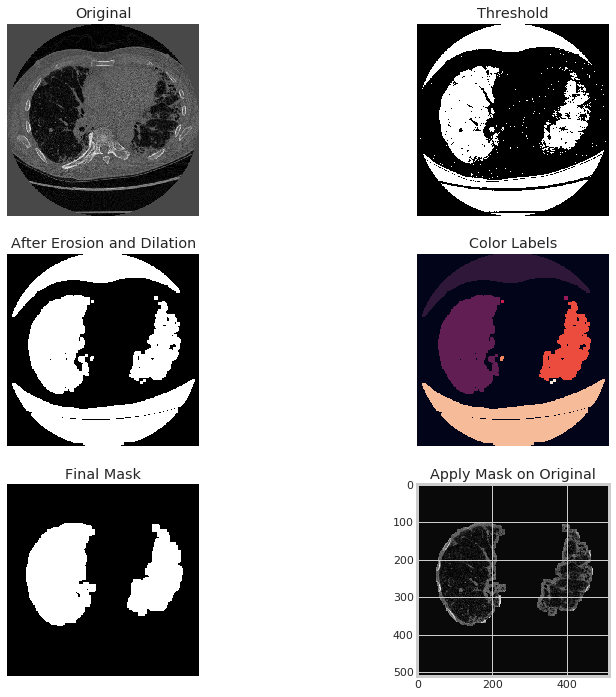

In [51]:
path = "./train/ID00007637202177411956430/19.dcm"
dataset = pydicom.dcmread(path)
img = dataset.pixel_array

# Masked image
mask_img = make_lungmask(img, display=True)

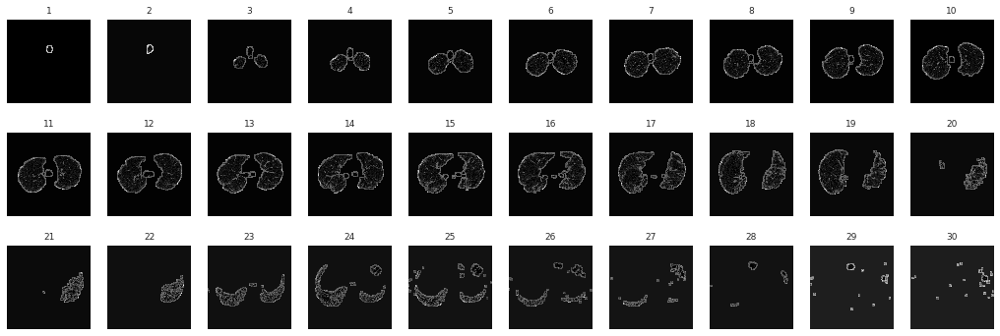

In [52]:
#Mask Images for one Patient
#Lungs are quite visible, but on images at the beginning and towards the end the lung dissapears completely

patient_dir = "./train/ID00007637202177411956430"
datasets = []

# First Order the files in the dataset
files = []
for dcm in list(os.listdir(patient_dir)):
    files.append(dcm) 
files.sort(key=lambda f: int(re.sub('\D', '', f)))

# Read in the Dataset
for dcm in files:
    path = patient_dir + "/" + dcm
    datasets.append(pydicom.dcmread(path))
    
imgs = []
for data in datasets:
    img = data.pixel_array
    imgs.append(img)
    
    
# Show masks
fig=plt.figure(figsize=(16, 6))
columns = 10
rows = 3

for i in range(1, columns*rows +1):
    img = make_lungmask(datasets[i-1].pixel_array)
    fig.add_subplot(rows, columns, i)
    plt.imshow(img, cmap="gray")
    plt.title(i, fontsize = 9)
    plt.axis('off');

In [53]:
#import cudf
import tqdm

In [54]:
def get_observation_data(path):
  
  image_data = pydicom.read_file(path)

  #Dictionary to store the information from the image
  observation_data = {
      "FileNumber" : path.split("/")[2],
      "Rows" : image_data.get("Rows"),
      "Columns" : image_data.get("Columns"),
      "PatientID" : image_data.get("PatientID"),
      "BodyPartExamined" : image_data.get("BodyPartExamined"),
      "RotationDirection" : image_data.get("RotationDirection"),
      "ConvolutionKernel" : image_data.get("ConvolutionKernel"),
      "PatientPosition" : image_data.get("PatientPosition"),
      "PhotometricInterpretation" : image_data.get("PhotometricInterpretation"),
      "Modality" : image_data.get("Modality"),
      "StudyInstanceUID" : image_data.get("StudyInstanceUID"),
      "PixelPaddingValue" : image_data.get("PixelPaddingValue"),
      "SamplesPerPixel" : image_data.get("SamplesPerPixel"),
      "BitsAllocated" : image_data.get("BitsAllocated"),
      "BitsStored" : image_data.get("BitsStored"),
      "HighBit" : image_data.get("HighBit"),
      "PixelRepresentation" : image_data.get("PixelRepresentation"),
      "RescaleType" : image_data.get("RescaleType"),
  }

    # Integer columns
  int_columns = ["SliceThickness", "KVP", "DistanceSourceToDetector", 
      "DistanceSourceToPatient", "GantryDetectorTilt", "TableHeight", 
      "XRayTubeCurrent", "GeneratorPower", "WindowCenter", "WindowWidth", 
      "SliceLocation", "RescaleIntercept", "RescaleSlope"]
  for k in int_columns:
      observation_data[k] = int(image_data.get(k)) if k in image_data else None

  # String columns
  str_columns = ["ImagePositionPatient", "ImageOrientationPatient", "ImageType", "PixelSpacing"]
  for k in str_columns:
      observation_data[k] = str(image_data.get(k)) if k in image_data else None

  
  return observation_data

In [55]:
p = "./train/ID00007637202177411956430/10.dcm"
example = get_observation_data(p)

In [56]:
example

{'FileNumber': 'ID00007637202177411956430',
 'Rows': 512,
 'Columns': 512,
 'PatientID': 'ID00007637202177411956430',
 'BodyPartExamined': 'Chest',
 'RotationDirection': 'CW',
 'ConvolutionKernel': 'BONE',
 'PatientPosition': 'FFS',
 'PhotometricInterpretation': 'MONOCHROME2',
 'Modality': 'CT',
 'StudyInstanceUID': '2.25.80896671862726099888461805953012988790',
 'PixelPaddingValue': -2000,
 'SamplesPerPixel': 1,
 'BitsAllocated': 16,
 'BitsStored': 16,
 'HighBit': 15,
 'PixelRepresentation': 1,
 'RescaleType': 'HU',
 'SliceThickness': 1,
 'KVP': 120,
 'DistanceSourceToDetector': 949,
 'DistanceSourceToPatient': 541,
 'GantryDetectorTilt': 0,
 'TableHeight': 130,
 'XRayTubeCurrent': 79,
 'GeneratorPower': 9600,
 'WindowCenter': -500,
 'WindowWidth': -1500,
 'SliceLocation': -159,
 'RescaleIntercept': -1024,
 'RescaleSlope': 1,
 'ImagePositionPatient': '[-158.700, -153.500, -159.750]',
 'ImageOrientationPatient': '[1.000000, 0.000000, 0.000000, 0.000000, 1.000000, 0.000000]',
 'ImageTyp